In [28]:
from IPython.display import Image

# Part A: E4D Installation on NERSC

Part_A_E4D_Install is the first section of the PFLOTRAN_E4D_Coupling workflow. This notebook will show you how to **install and compile E4D** following **Tim C. Johnson's (also E4D Author) instruction**. Please see the link for the author's website: https://bitbucket.org/john775/e4d_dev/wiki/Home.<br>
This notebook will show the complete installation steps and results of installing E4D on NERSC. Some tips will be also included in this notebook. Some instruction steps are not the same with Tim's because I do not have permission to install softwares or packages on NERSC, so some alternatives methods are used here. If you want to install E4D on your own system, you can follow Tim's instruction absolutely. I will also explain what alternative methods I use and why I use them. The necessary shell scripts are included in corresponding steps.<br>
Thank you for reading this notebook. If you have any question or any advice to promote this notebook, please send Email to hongsheng.wang@pnnl.gov. Also, if you think anything in this repository is not allowed, please contact me and I will delete relevant contents once I receive your Email.

## Step 1: Log in NERSC

First, log in your NERSC Account. For learning how to apply for your own account, please check the link:<br>
https://www.nersc.gov/users/accounts/user-accounts/ <br>
I also upload the training document -- **'AccountsAllocations-20190621.pdf' (Author: NERSC Training Group)** in the same folder.<br>
After the account allocation, using the command below to log in. For example, my user-name is <font color='red'>**vthw28**</font> :

**Command Example 1.1**
```Linux Terminal
ssh your_username@cori.nersc.gov
```

In [29]:
Image(filename='E4D_Install_Screenshot/1_1_log_nersc.png')

Then, input your password and OTP. For example, if my password is **'vthw28password'** and OPT is **'123456'**, what you need to input here is **'vthw28password123456'**. No space or any symbols should be between them.

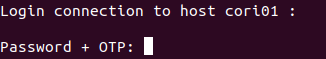

In [30]:
Image(filename='E4D_Install_Screenshot/1_2_password_nersc.png')

Please keep in mind the **Programming Environment** on NERSC is very important. The plot below shows you the default modules loaded once logging in NERSC. The default Prgramming Environment is **'intel'** by default. Use the command below to list the modules loaded:

**Command Example 1.2**
```Linux Terminal
module list
```

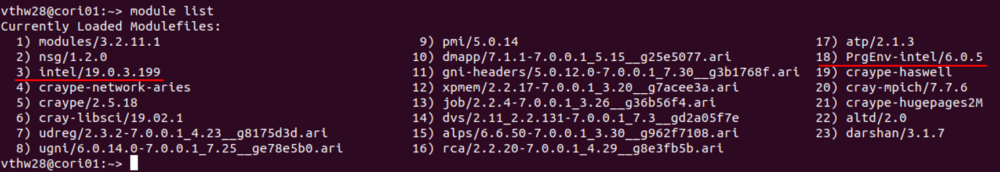

In [31]:
Image(filename='E4D_Install_Screenshot/1_3_nersc_prgenv_default.png')

E4D Compilation needs **'make'** and **'gfortran'** available. I swap to another programming environment -- **'gnu'**. If you want to use **'intel'**, you can check more information using the link: https://www.nersc.gov/users/software/compilers/.<br>
If you want to swap the programming environment to 'gnu', please use the command below:

**Command Example 1.3**
```Linux Terminal
module swap PrgEnv-intel PrgEnv-gnu
```

In [32]:
Image(filename='E4D_Install_Screenshot/1_4_module_swap.png')

Check if **'gcc'** and **'PrgEnv-gnu'** are loaded or not.

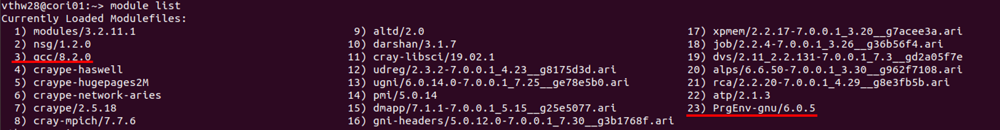

In [33]:
Image(filename='E4D_Install_Screenshot/1_5_nersc_module_gnu.png')

## Step 2: Clone the E4D Repository

Enter the path you want to install E4D and start to download, install and compile E4D.<br>
For example, I want to install E4D on our group project path: **'/global/project/projectdirs/m1800'**. Use the command below to enter that path: <br>

**Command Example 2.1**
```Linux Terminal
cd /global/project/projectdirs/m1800
```

In [34]:
Image(filename='E4D_Install_Screenshot/1_6_enter_path.png')

Create a folder you want put E4D. For example, I created a folder name **'E4D_20190818'** using the command below:

**Command Example 2.2**
```Linux Terminal
mkdir E4D_20190818
```

In [35]:
Image(filename='E4D_Install_Screenshot/1_7_mkdir.png')

Enter the directory you created:

**Command Example 2.3**
```Linux Terminal
cd E4D_20190818
```

In [36]:
Image(filename='E4D_Install_Screenshot/1_8_enter_dir.png')

<font color='red'>Tips: From here is an alternative way to clone the repository because I can't load **'mercurial'** and I do not have **'sudo'** priviledge to install that.<br> 
    NERSC does not support the Mercurial module in CLE7. You may currently access the CLE modulefiles which includes mercurial module with the command below. However, please be aware that these are built for CLE6 and are therefore not guaranteed to work under CLE7.

**Command Example**
```Linux Terminal
module use /global/common/cori_cle6/software/modulefiles
```

If you have 'mercurial' available, you can enter your target directory and run the command below:

**Command Example (Not on NERSC)**
```Linux Terminal
hg clone https://john775@bitbucket.org/john775/e4d_dev
```

<font color='red'>If you do not have 'mercurial', use the command below to install that:

**Command Example (Not on NERSC)**
```Linux Terminal
sudo apt-install mercurial
```

Open the Web Page using the link: https://bitbucket.org/john775/e4d_dev/wiki/Home.

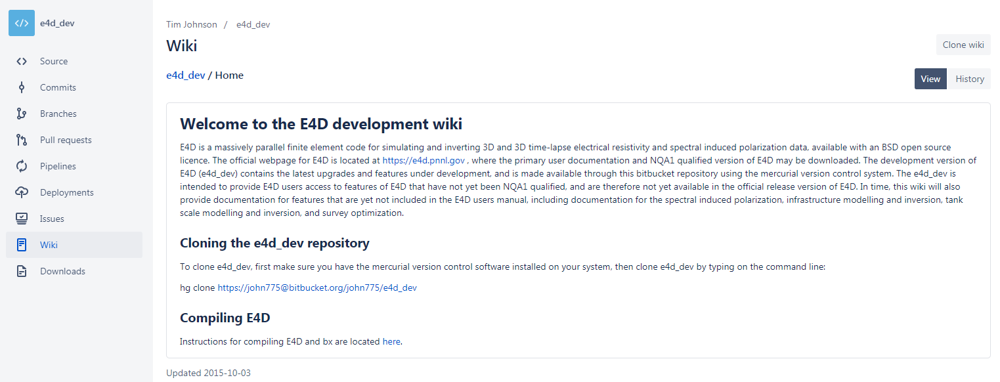

In [37]:
Image(filename='E4D_Install_Screenshot/1_9_E4D_website.png')

So I download the repository directly. Get the download link address. <font color='red'>**Right click**<font> the download link and click <font color='red'>**'Copy link address'**<font>.

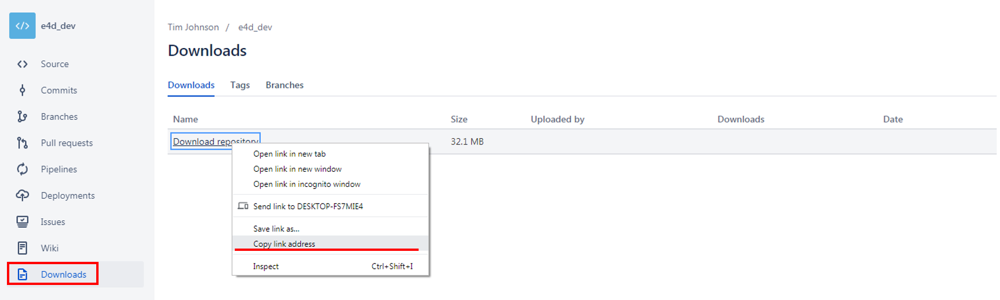

In [38]:
Image(filename='E4D_Install_Screenshot/1_10_download_repository.png')

Use the command below in the terminal to download the repository:

**Command Example 2.4**
```Linux Terminal
wget https://bitbucket.org/john775/e4d_dev/get/6c6612ece50d.zip
```

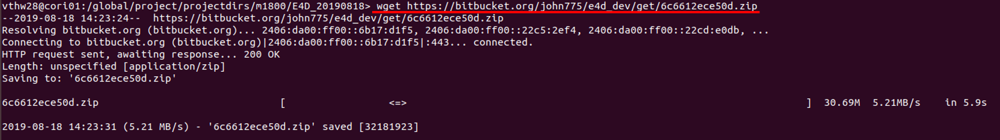

In [39]:
Image(filename='E4D_Install_Screenshot/1_11_downloading_repo.png')

You can see the compressed file of repository is downloading. Once finished, using the command below to unzip it:

**Command Example 2.5**
```Linux Terminal
unzip 6c6612ece50d.zip
```

Use the command **<font color='red'>'ls'</font>** to see what you have in your folder now.

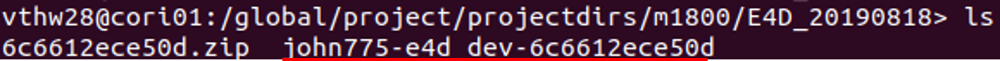

In [40]:
Image(filename='E4D_Install_Screenshot/1_13_unzipped_files.png')

Rename the file **'john775-e4d_dev-6c6612ece50d'** as whatever you want for your convenience. For example, I rename it as **'e4d_dev'** using the command below:

**Command Example 2.6**
```Linux Terminal
mv john775-e4d_dev-6c6612ece50d e4d_dev
```

In [41]:
Image(filename='E4D_Install_Screenshot/1_14_rename_e4d.png')

Check what you have in your folder. The folder should be **'e4d_dev'** now.

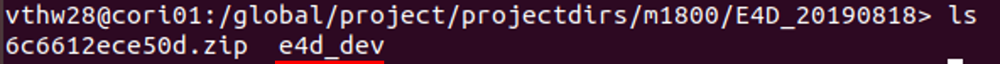

In [42]:
Image(filename='E4D_Install_Screenshot/1_15_after_rename.png')

In the folder 'e4d_dev', there is a file name <font color='red'>'e4d_version.txt'</font> containing the e4d version: <font color='red'>6c6612ece50d</font>.

## Step 3: Compile E4D

Download and compile PETSc using the command below:

**Command Example 3.1**
```Linux Terminal
git clone https://bitbucket.org/petsc/petsc petsc
```

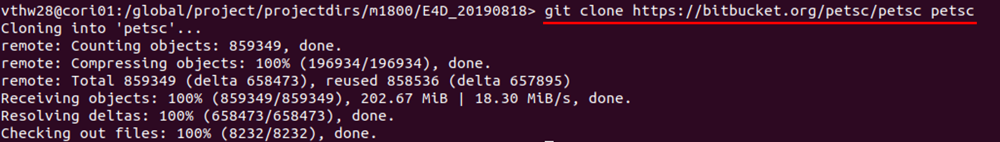

In [43]:
Image(filename='E4D_Install_Screenshot/1_16_clone_petsc.png')

Enter the folder cloned. Its name should be **'petsc'**. Or you can check what the folder name is.

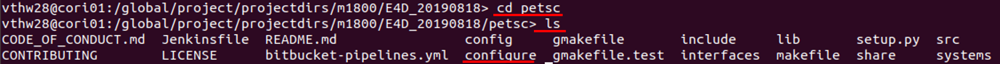

In [44]:
Image(filename='E4D_Install_Screenshot/1_17_enter_petsc.png')

The next step is to configure PETSc using the command. This process will be some minutes and you will see some **'WARNING:'s** which can be ignored.

**Command Example 3.2**
```Linux Terminal
./configure --with-cc=gcc --with-fc=gfortran --download-fblaslapack --download-mpich --with-debugging=0
```

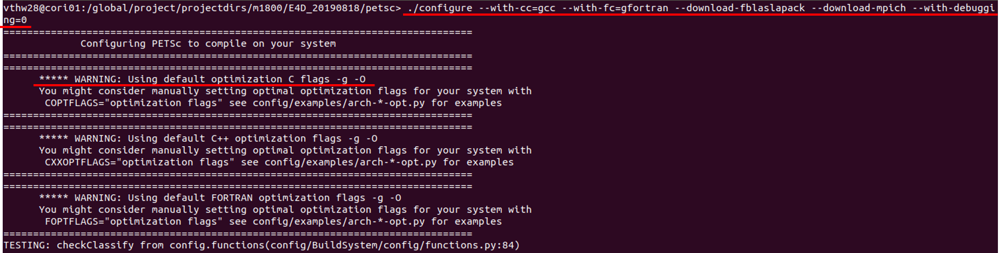

In [45]:
Image(filename='E4D_Install_Screenshot/1_18_configuring_petsc.png')

**Command Example 3.3**<br>
After the configuration, you should see the command on how to build PETSc libraries. Copy and paste it to the command line and run it.

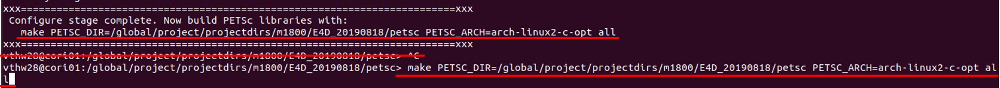

In [46]:
Image(filename='E4D_Install_Screenshot/1_19_petsc_build.png')

After building the PETSc, you have an option to test it or not following the command. I select to test it.

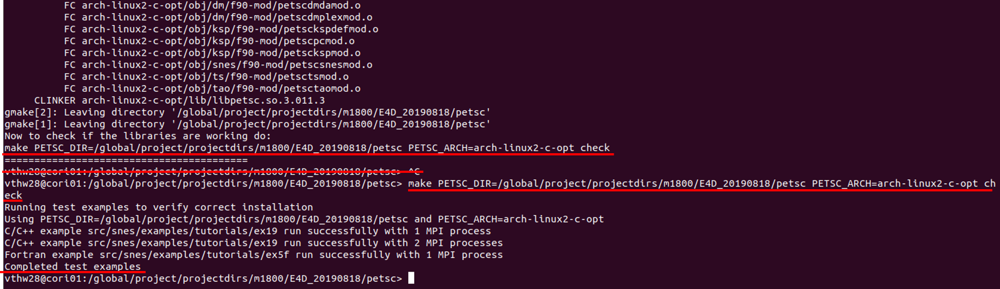

In [47]:
Image(filename='E4D_Install_Screenshot/1_20_petsc_test.png')

Once the compilation of 'PETSc' is successful, you can find **executable 'mpirun'** in the folder **'petsc-<>/arch-<>/bin'**. For example, in my case, the path should be **'petsc/arch-linux2-c-opt/bin'**.<br> 
<font color='red'>**'mpirun'** can allocate specific number processors to run E4D.<font>

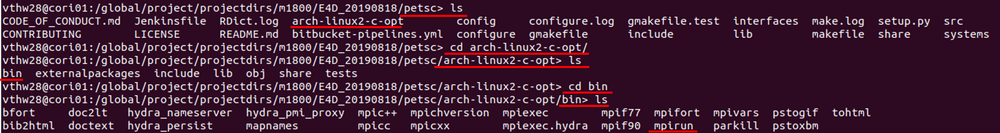

In [48]:
Image(filename='E4D_Install_Screenshot/1_21_petsc_folder.png')

Enter the folder **'e4d_dev/src'**. Set the path with your own case. For my case, use the command to this folder:

**Command Example 3.4**
```Linux Terminal
cd /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/src
```

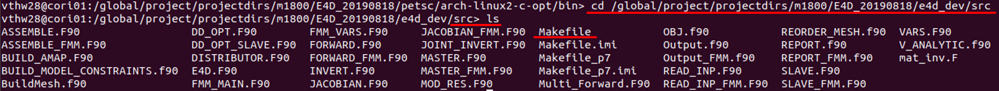

In [49]:
Image(filename='E4D_Install_Screenshot/1_22_e4d_src.png')

Edit the **'Makefile'** by defining the **'PETSc_dir'** and **'PETSc_Arch-<>_dir'** accrording your own case. Use the command below to open **'Makefile'**:

**Command Example 3.5**
```Linux Terminal
vim Makefile
```

In [50]:
Image(filename='E4D_Install_Screenshot/1_23_vim_M.png')

The original 'Makefile' are shown below. What we need to edit are **'PETSC_DIR'** and **'PETSC_ARCH'**.

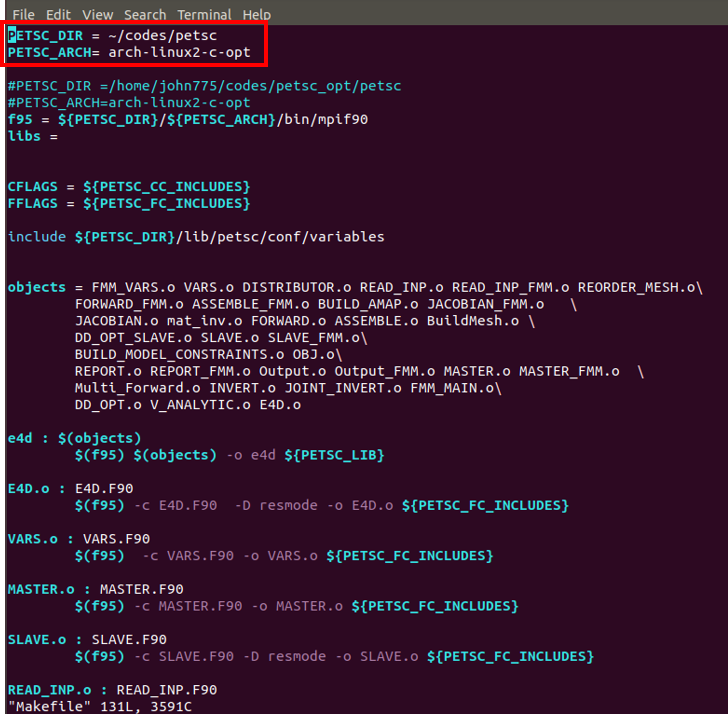

In [51]:
Image(filename='E4D_Install_Screenshot/1_24_ori_Makefile.png')

For my case, edit the 'PETSC_DIR' and 'PETSC_ARCH' according the previous installation and comilation steps:<br>
<font color='red'><center>**PETSC_DIR = /global/project/projectdirs/m1800/E4D_20190818/petsc**<center><font><br>
    <font color='red'><center>**PETSC_ARCH = arch-linux2-c-opt**<center><font>

<font color='red'>Tips: You need to check the exact path of 'PETSc'. Also, 'PETSC_ARCH' would be 'arch-linux2-c-opt' or 'arch-linux-c-op'. Please check it carefully.<br>

Press **'i'** to make the file editable. Once the change is finished, press **'Esc'** to exit editable mode. Then, type **':wq'** to save the file with change. For my case, the Makefile after the editing should be like the plot below.

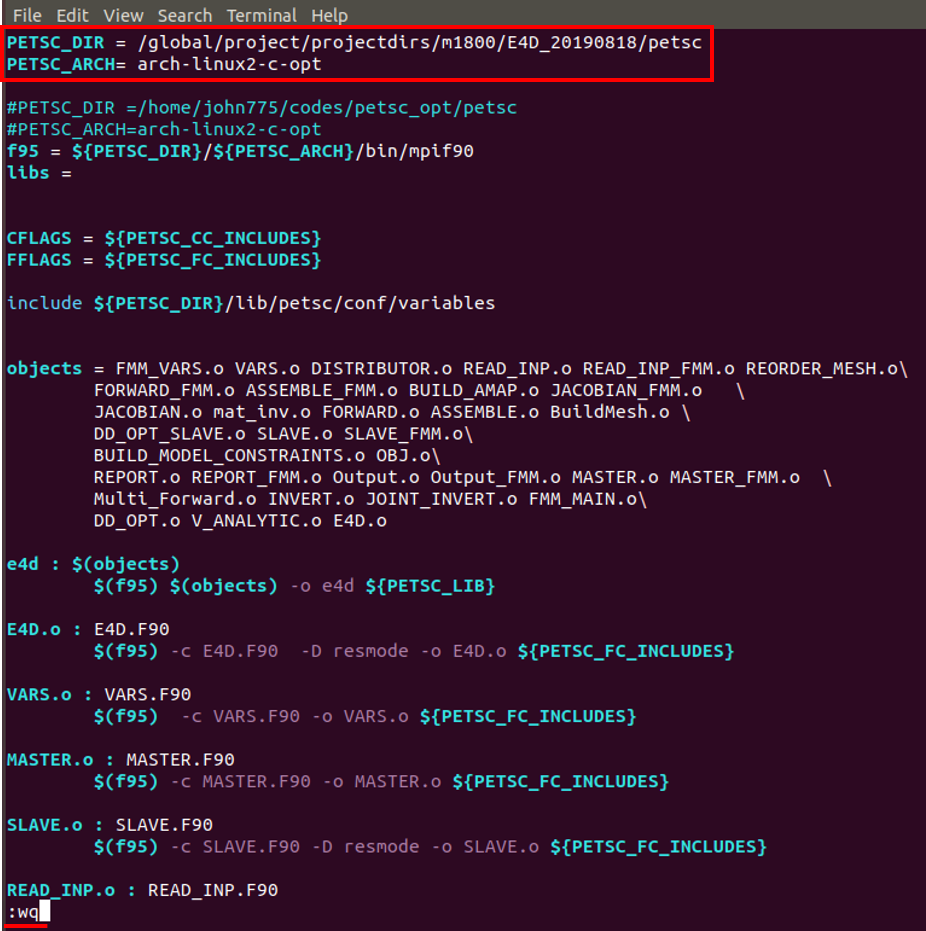

In [52]:
Image(filename='E4D_Install_Screenshot/1_25_edit_Makefile.png')

Compile E4D using the command below. You will see some **'Warning:'s** which can be ignored.:

**Command Example 3.6**
```Linux Terminal
make -f Makefile
```

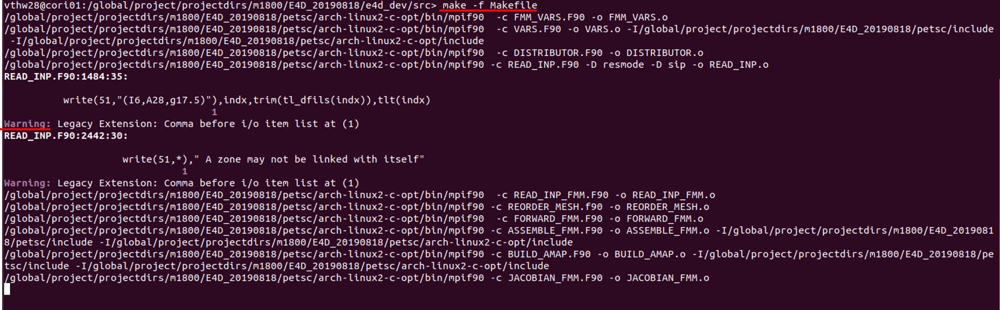

In [53]:
Image(filename='E4D_Install_Screenshot/1_26_making_Makefile.png')

Once the compilation is successful, you can find the executable **'e4d'** in the same folder.

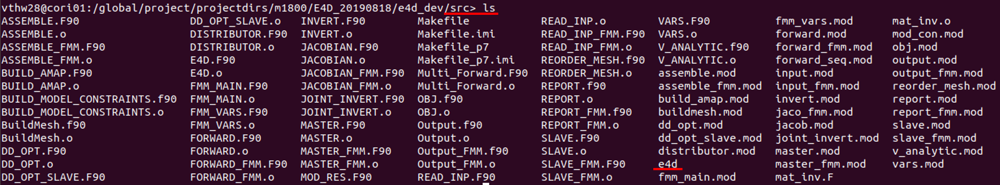

In [54]:
Image(filename='E4D_Install_Screenshot/1_27_compilation_e4d.png')

<font color='red'>Tip: For my own case, I created a folder name **'bin'** to put all the execuables: **e4d** in this step, and **bx, triangle, tetgen** for convenience. However, this is not mandatory. You can skip relevant commands and use the source path of these executables.

For my case, I created a folder name **'bin'** under the path **'/global/project/projectdirs/m1800/E4D_20190818/e4d_dev/'** and copy the excutable **'e4d'** to the **'bin'** folder. Use the command below to create a new folder:

**Command Example 3.7**
```Linux Terminal
cd /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/
mkdir bin
```

Copy a file from the source_path to destination_path:

**Command Example 3.8**
```Linux Terminal
cp /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/src/e4d /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/bin
```

<font color='red'>Tip: **/global/project/projectdirs/m1800/E4D_20190818/e4d_dev/src/e4d** is the source path of excutable e4d, and **/global/project/projectdirs/m1800/E4D_20190818/e4d_dev/bin** is the destination path. </font>

See the commands below I used in my case as an example.

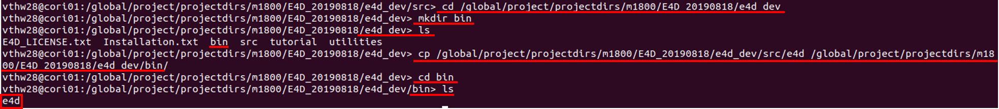

In [55]:
Image(filename='E4D_Install_Screenshot/1_28_cp_e4d.png')

## Step 4: Compile bx

Enter the path **'/global/project/projectdirs/m1800/E4D_20190818/e4d_dev'** and create a folder to put all the third-party packages including **'bx'**, **'triangle'**, and **'tetgen'**.

**Command Example 4.1**
```Linux Terminal
mkdir third_party
```

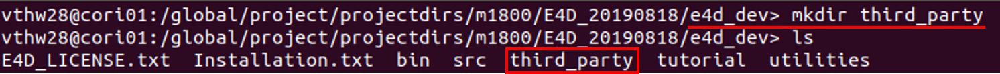

In [56]:
Image(filename='E4D_Install_Screenshot/1_29_mk_third.png')

Enter the new created **'third_party'** and download the lastest stable release of **'netcdf'** from the link: http://www.unidata.ucar.edu/downloads/netcdf/index.jsp

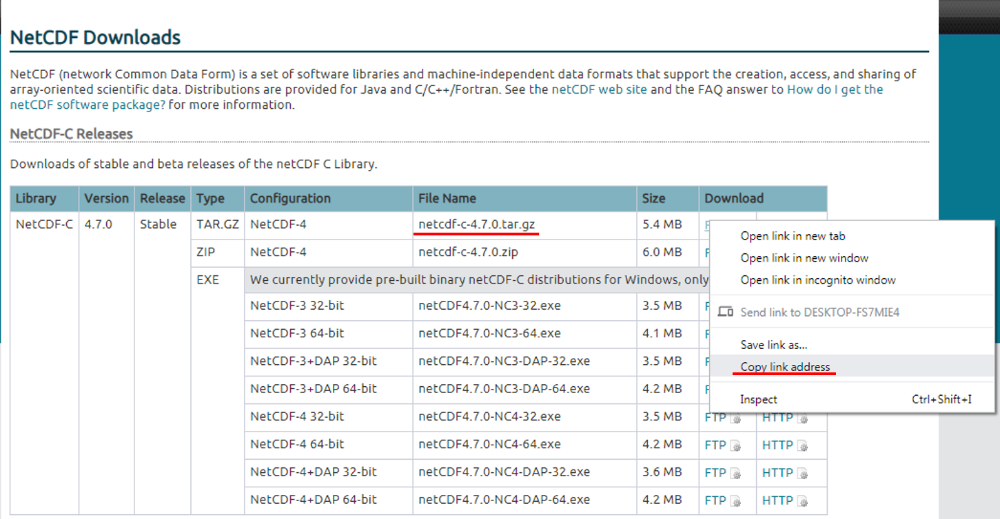

In [57]:
Image(filename='E4D_Install_Screenshot/1_30_netcdf_download.png')

Use the command below to download **'netcdf-c-4.7.0.tar.gz'** into the **'third_party'** folder:

**Command Example 4.2**
```Linux Terminal
wget ftp://ftp.unidata.ucar.edu/pub/netcdf/netcdf-c-4.7.0.tar.gz
```

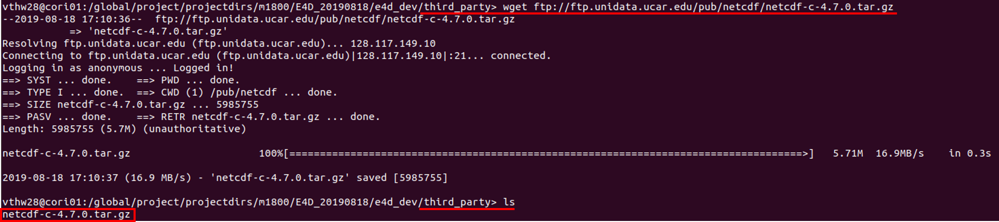

In [58]:
Image(filename='E4D_Install_Screenshot/1_31_netcdf_downloading.png')

Untar the **'netcdf'** library using the command below:

**Command Example 4.3**
```Linux Terminal
tar -xvzf netcdf-c-4.7.0.tar.gz
```

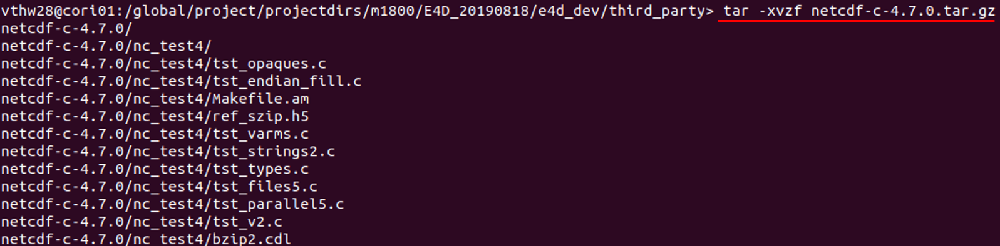

In [59]:
Image(filename='E4D_Install_Screenshot/1_32_untar_netcdf.png')

After untarring the compressed file and rename it for your own convenience. Or you can keep its original name for version check.<br>
For my own case, I rename and creat a file **'netcdf_version.txt'** including the netcdf version: **4.7.0**.

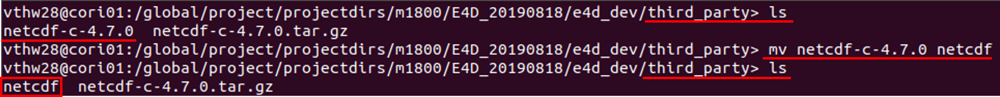

In [60]:
Image(filename='E4D_Install_Screenshot/1_33_netcdf.png')

Enter **'netcdf'** and configure **'netcdf'** using the command:

**Command Example 4.4**
```Linux Terminal
cd netcdf/
./configure --disable-netcdf-4 --disable-dap
```

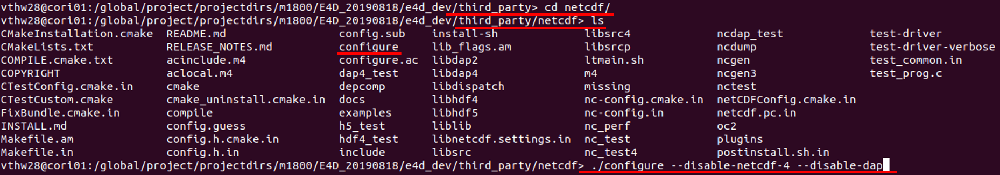

In [79]:
Image(filename='E4D_Install_Screenshot/1_34_compile_netcdf.png')

After the comfiguration, you can see the information of the **'netcdf'** library. Please see an example below.

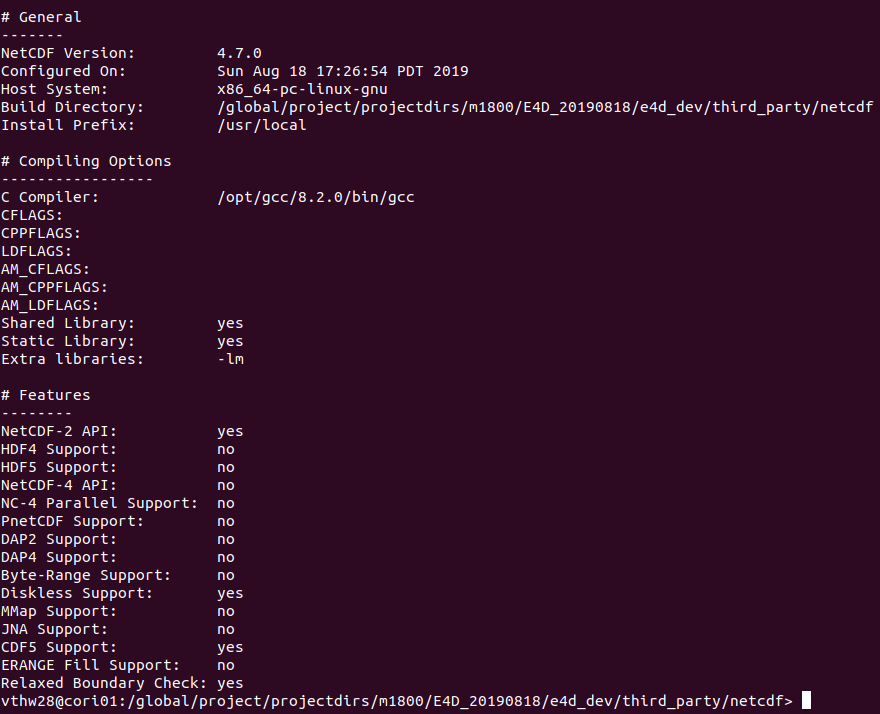

In [62]:
Image(filename='E4D_Install_Screenshot/1_35_after_compile_netcdf.png')

Compile **'netcdf'** using command:

**Command Example 4.5**
```Linux Terminal
make
```

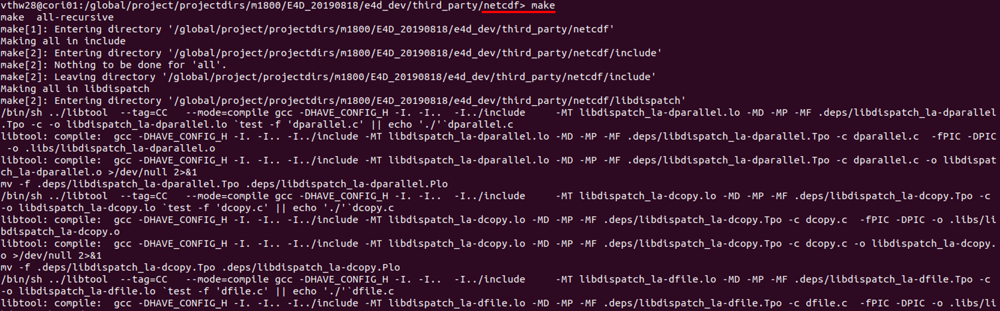

In [63]:
Image(filename='E4D_Install_Screenshot/1_36_make_netcdf.png')

<font color='red'>Tips: There is one more step in Tim's instruction **'Install 'netcdf'** using the command **'make install'**. But I do not have permission to do that on NERSC, so I have to skip this step. It will cause a problem when you run **E4D**: **../../../bin/bx: error while loading shared libraries: libnetcdf.so.15: cannot open shared object file: No such file or directory**.<br>
    You can solve that problem by adding the path of the share libraries mannually. I will show how to do that on **'Step 7: E4D Test'**.<font>

Download the latest stable release of exodus into **'third_party'** folder. Download link: https://launchpad.net/ubuntu/+source/exodusii

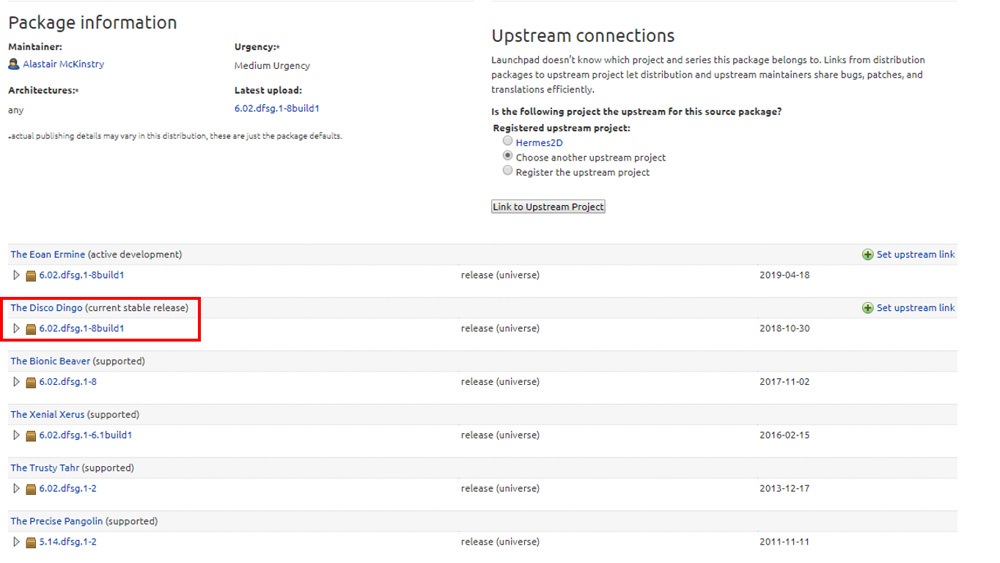

In [64]:
Image(filename='E4D_Install_Screenshot/1_37_exodus_web.png')

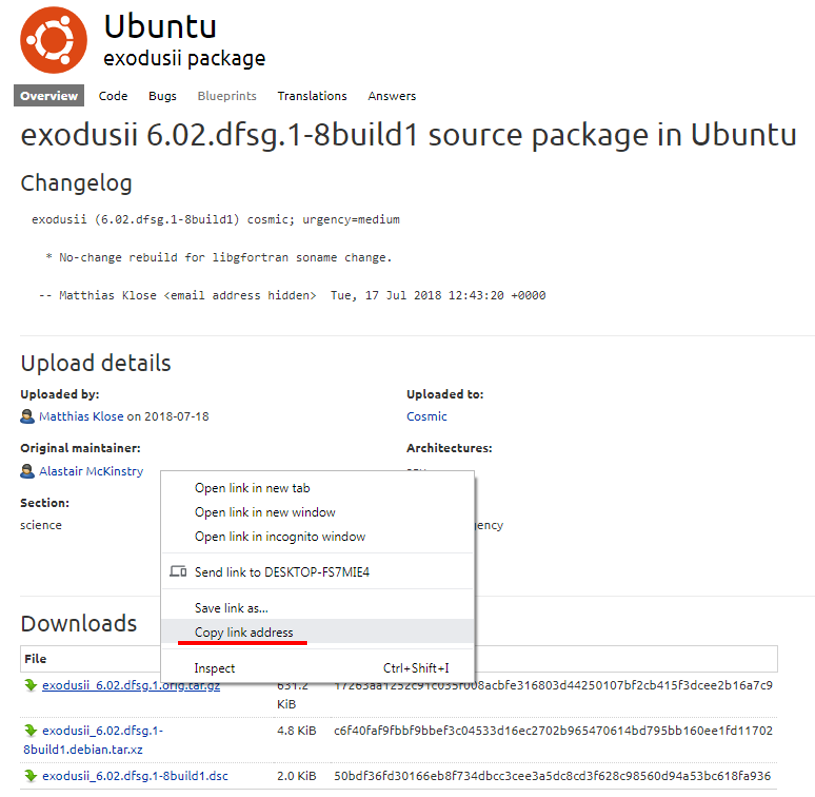

In [65]:
Image(filename='E4D_Install_Screenshot/1_38_exodus_download.png')

Under the folder **'third_parth'**, use the command to download the exodusii package:

**Command Example 4.6**
```Linux Terminal
wget https://launchpad.net/ubuntu/+archive/primary/+sourcefiles/exodusii/6.02.dfsg.1-8build1/exodusii_6.02.dfsg.1.orig.tar.gz
```

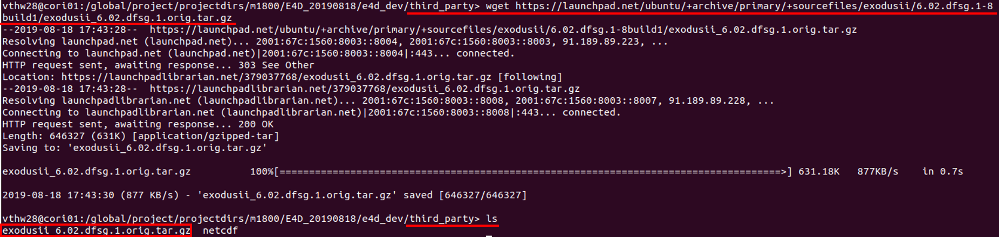

In [66]:
Image(filename='E4D_Install_Screenshot/1_39_exodus_downloaded.png')

Untar the compressed file using the command below:

**Command Example 4.7**
```Linux Terminal
tar -xvzf exodusii_6.02.dfsg.1.orig.tar.gz
```

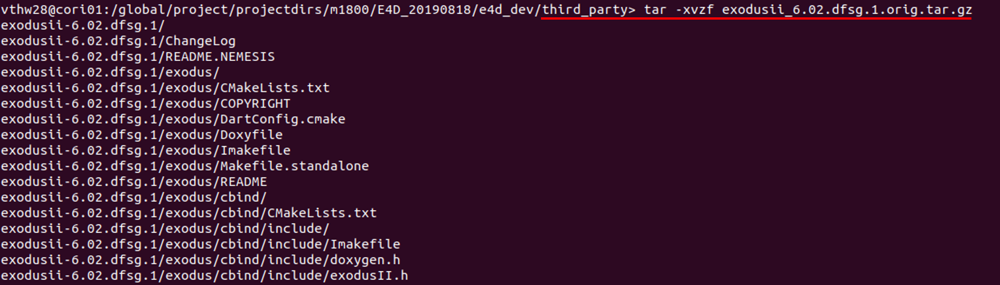

In [67]:
Image(filename='E4D_Install_Screenshot/1_40_untar_exodus.png')

Here, I rename the **'exodusii-6.02.dfsg.1'** as **'exodus'** for convenience. Also, a file named **'Exodusii_version.txt'** containing the exodusii version: **6.02.dfsg.1-8build1**. You can keep its original name for version check.

**Command Example 4.8**
```Linux Terminal
mv exodusii-6.02.dfsg.1/ exodus
```

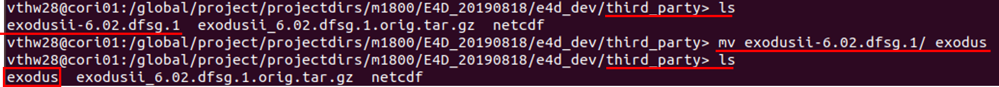

In [68]:
Image(filename='E4D_Install_Screenshot/1_41_exodus_rename.png')

Enter the folder **'exodus/exodus'** to edit the file **'Makefile.standalone'**.

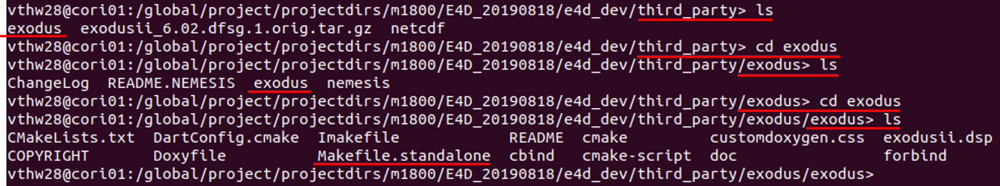

In [69]:
Image(filename='E4D_Install_Screenshot/1_42_exodus_MA.png')

Open the file **'Makefile.standalone'**.

**Command Example 4.9**
```Linux Terminal
vim Makefile.standalone
```

In [70]:
Image(filename='E4D_Install_Screenshot/1_43_vim_MA.png')

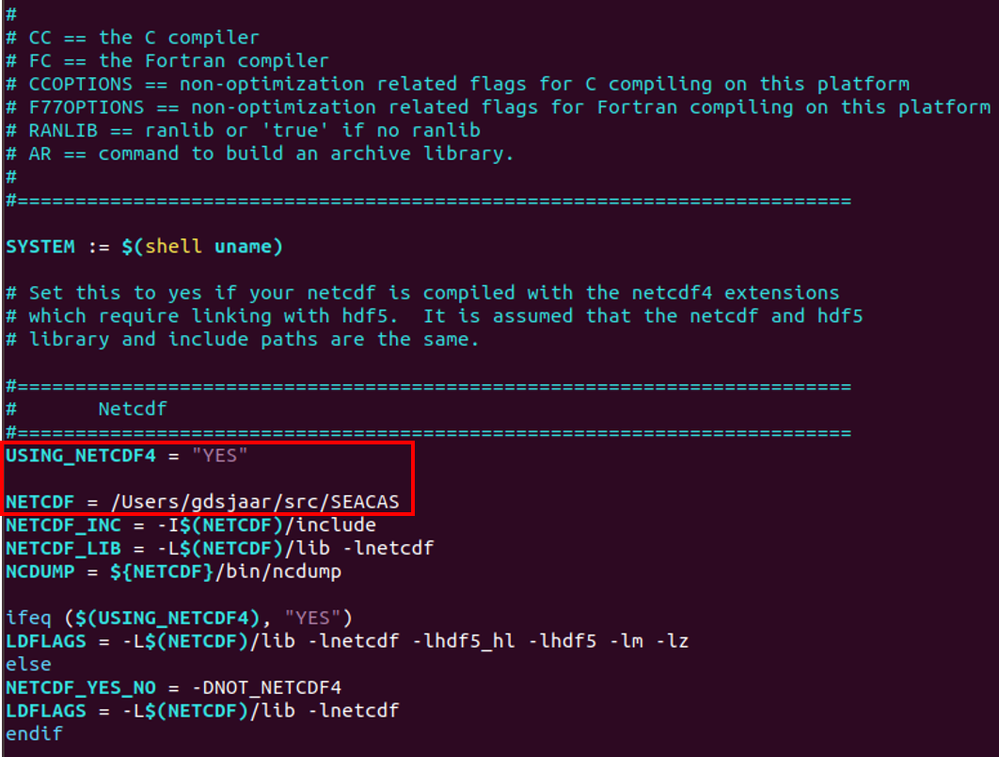

In [71]:
Image(filename='E4D_Install_Screenshot/1_44_ori_MA.png')

<font color='red'>Tips: All the changes in **'Makefile'** or **'Makefile.standalone'** should follow your own path where **'exodus'** and **'netcdf'**. Please check it carefully..<br>

Edit two options: <br>
<font color = 'red'>**'USING_NETCDF4 = "YES"'** to **'USING_NETCDF4 = "NO"'**<br> 
    **'NETCDF = /Users/gdsjaar/src/SEACAS'** to **'NETCDF = /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/third_party/netcdf'**.</font><br> 
    Please check your own **'netcdf'** path carefully.

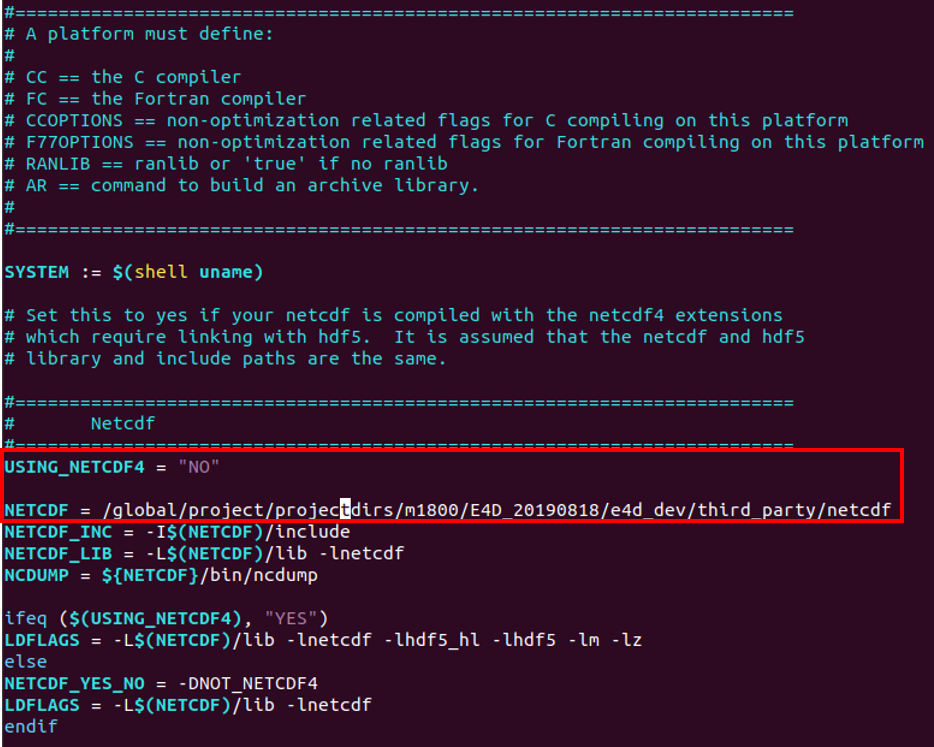

In [72]:
Image(filename='E4D_Install_Screenshot/1_45_edit_MA.png')

Compile **'exodus'** using the command and ignore the **'warning's** here:

**Command Example 4.10**
```Linux Terminal
make -f Makefile.standalone
```

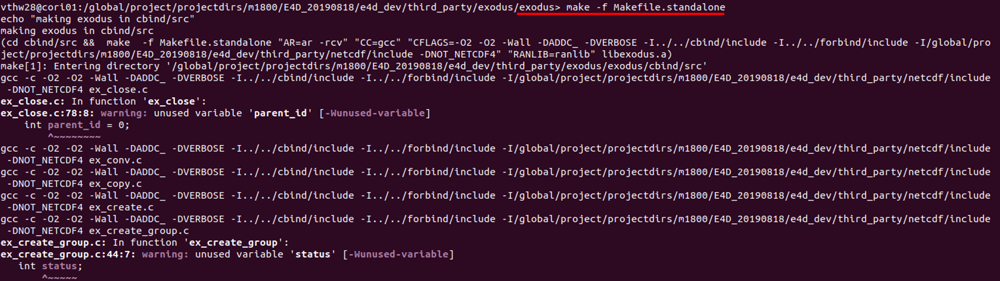

In [73]:
Image(filename='E4D_Install_Screenshot/1_46_make_MA.png')

Now, enter the path **'e4d_dev/utilities/bx'** and edit the file **'Makefile'**.

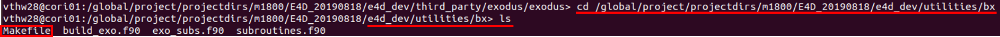

In [74]:
Image(filename='E4D_Install_Screenshot/1_47_bx_makefile.png')

Open the **'Makefile'**.

**Command Example 4.11**
```Linux Terminal
vim Makefile
```

In [75]:
Image(filename='E4D_Install_Screenshot/1_48_vim_makefile.png')

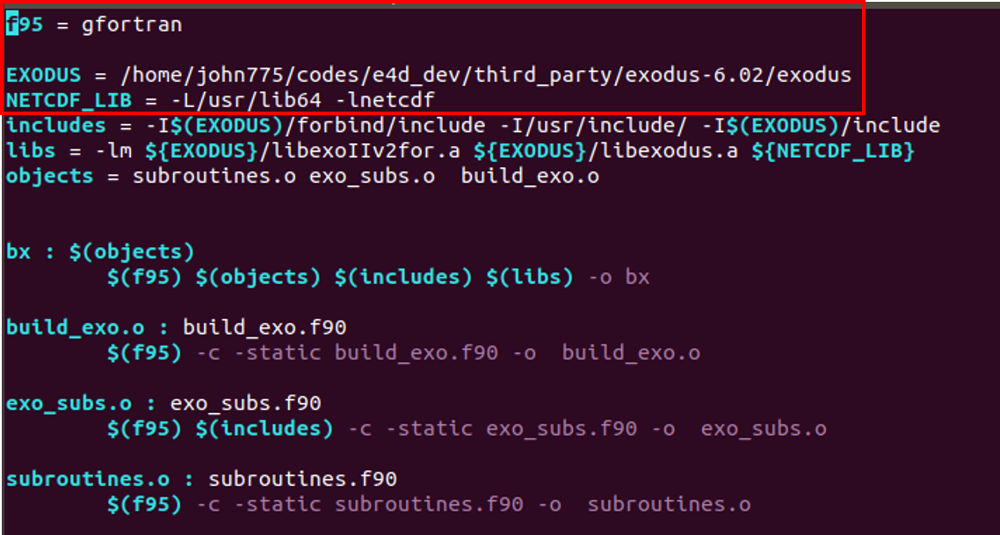

In [76]:
Image(filename='E4D_Install_Screenshot/1_49_ori_bx_makefile.png')

<font color='red'>Tips: All the changes in **'Makefile'** or **'Makefile.standalone'** should follow your own path where **'exodus'** and **'netcdf'**. Please check it carefully..<br>

Add one line<br>
<font color='red'>**'NETCDF = /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/third_party/netcdf'**</font><br> under the line **'f95 = gfortran'**.<br>
Edit two options<br> 
<font color='red'>**'EXODUS = /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/third_party/exodus/exodus'**<br>
**'NETCDF_LIB = -L/global/project/projectdirs/m1800/E4D_20190818/e4d_dev/third_party/netcdf/liblib/.libs -lnetcdf'**</font>.

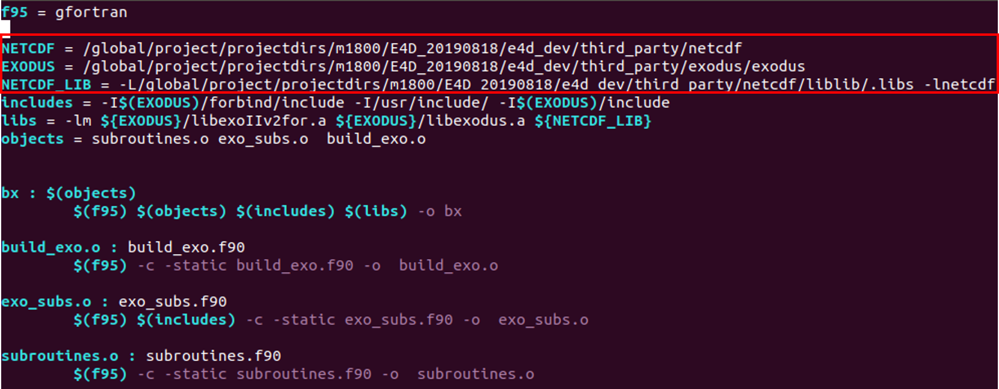

In [77]:
Image(filename='E4D_Install_Screenshot/1_50_edit_bx_makefile.png')

Compile 'bx' using command below:

**Command Example 4.12**
```Linux Terminal
make
```

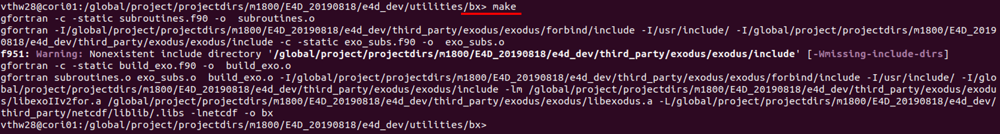

In [78]:
Image(filename='E4D_Install_Screenshot/1_51_make_bx.png')

Once the **'bx'** is compiled, you can find the excutable **'bx'**. Copy it into the folder **'e4d_dev/bin'**. I did not include the **'source_path'** of **'bx'** here because I am already in the **'source_path'**. There is a little differece of using **'cp'** with the step of copying **'e4d'**. Both of these two commands will work. Hope no confusion to you.

**Command Example 4.13**
```Linux Terminal
cp bx /global/project/projectdirs/m1800/E4D_20190818/e4d_dev/bin/
```

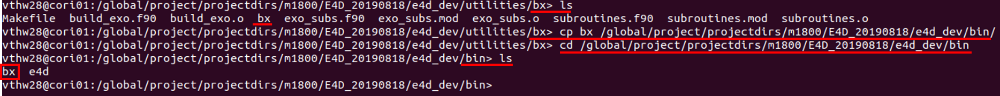

In [58]:
Image(filename='E4D_Install_Screenshot/1_52_cp_bx.png')